In [31]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
plt.style.use('ggplot')
pd.set_option('display.max_columns', 200)
from ydata_profiling import ProfileReport
import plotly.express as px
%matplotlib inline

# Step 1: Data Understanding

In [32]:
df0 = pd.read_csv('archive (1)\coaster_db.csv')
df0.head()

,coaster_name,Length,Speed,Location,Status,Opening date,Type,Manufacturer,Height restriction,Model,Height,Inversions,Lift/launch system,Cost,Trains,Park section,Duration,Capacity,G-force,Designer,Max vertical angle,Drop,Soft opening date,Fast Lane available,Replaced,Track layout,Fastrack available,Soft opening date.1,Closing date,Opened,Replaced by,Website,Flash Pass Available,Must transfer from wheelchair,Theme,Single rider line available,Restraint Style,Flash Pass available,Acceleration,Restraints,Name,year_introduced,latitude,longitude,Type_Main,opening_date_clean,speed1,speed2,speed1_value,speed1_unit,speed_mph,height_value,height_unit,height_ft,Inversions_clean,Gforce_clean
0,Switchback Railway,600 ft (180 m),6 mph (9.7 km/h),Coney Island,Removed,"June 16, 1884",Wood,LaMarcus Adna Thompson,NaN,Lift Packed,50 ft (15 m),NaN,gravity,NaN,NaN,Coney Island Cyclone Site,1:00,1600 riders per hour,2.9,LaMarcus Adna Thompson,30°,43 ft (13 m),NaN,NaN,NaN,Gravity pulled coaster,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1884,40.5740,-73.9780,Wood,1884-06-16,6 mph,9.7 km/h,6.0,mph,6.0,50.0,ft,NaN,0,2.9
1,Flip Flap Railway,NaN,NaN,Sea Lion Park,Removed,1895,Wood,Lina Beecher,NaN,NaN,NaN,1.0,NaN,NaN,a single car. Riders are arranged 1 across in ...,NaN,NaN,NaN,12,Lina Beecher,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1902,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1895,40.5780,-73.9790,Wood,1895-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,12.0
2,Switchback Railway (Euclid Beach Park),NaN,NaN,"Cleveland, Ohio, United States",Closed,NaN,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1895,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1896,41.5800,-81.5700,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN
3,Loop the Loop (Coney Island),NaN,NaN,Other,Removed,1901,Steel,Edwin Prescott,NaN,NaN,NaN,1.0,NaN,NaN,a single car. Riders are arranged 2 across in ...,NaN,NaN,NaN,NaN,Edward A. Green,NaN,NaN,NaN,NaN,Switchback Railway,NaN,NaN,NaN,1910,NaN,Giant Racer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1901,40.5745,-73.9780,Steel,1901-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN
4,Loop the Loop (Young's Pier),NaN,NaN,Other,Removed,1901,Steel,Edwin Prescott,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Edward A. Green,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1912,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1901,39.3538,-74.4342,Steel,1901-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN


In [33]:
#info about the df
df0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1087 entries, 0 to 1086
Data columns (total 56 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   coaster_name                   1087 non-null   object 
 1   Length                         953 non-null    object 
 2   Speed                          937 non-null    object 
 3   Location                       1087 non-null   object 
 4   Status                         874 non-null    object 
 5   Opening date                   837 non-null    object 
 6   Type                           1087 non-null   object 
 7   Manufacturer                   1028 non-null   object 
 8   Height restriction             831 non-null    object 
 9   Model                          744 non-null    object 
 10  Height                         965 non-null    object 
 11  Inversions                     932 non-null    float64
 12  Lift/launch system             795 non-null    o

In [34]:
# check the blank/na in the df
df0.isna().sum()

coaster_name                        0
Length                            134
Speed                             150
Location                            0
Status                            213
Opening date                      250
Type                                0
Manufacturer                       59
Height restriction                256
Model                             343
Height                            122
Inversions                        155
Lift/launch system                292
Cost                              705
Trains                            369
Park section                      600
Duration                          322
Capacity                          512
G-force                           725
Designer                          509
Max vertical angle                730
Drop                              593
Soft opening date                 991
Fast Lane available              1018
Replaced                          914
Track layout                      752
Fastrack ava

In [35]:
df0.describe()

,Inversions,year_introduced,latitude,longitude,speed1_value,speed_mph,height_value,height_ft,Inversions_clean,Gforce_clean
count,932.000000,1087.000000,812.000000,812.000000,937.000000,937.000000,965.000000,171.000000,1087.000000,362.000000
mean,1.547210,1994.986201,38.373484,-41.595373,53.850374,48.617289,89.575171,101.996491,1.326587,3.824006
std,2.114073,23.475248,15.516596,72.285227,23.385518,16.678031,136.246444,67.329092,2.030854,0.989998
min,0.000000,1884.000000,-48.261700,-123.035700,5.000000,5.000000,4.000000,13.100000,0.000000,0.800000
25%,0.000000,1989.000000,35.031050,-84.552200,40.000000,37.300000,44.000000,51.800000,0.000000,3.400000
50%,0.000000,2000.000000,40.289800,-76.653600,50.000000,49.700000,79.000000,91.200000,0.000000,4.000000
75%,3.000000,2010.000000,44.799600,2.778100,63.000000,58.000000,113.000000,131.200000,2.000000,4.500000
max,14.000000,2022.000000,63.230900,153.426500,240.000000,149.100000,3937.000000,377.300000,14.000000,12.000000


# Step 2: Data Preperation

- Dropping irrelevant columns and rows
- Identifying duplicated columns
- Renaming Columns
- Feature Creation

In [36]:
# selecting only the columns we need
df = df0[['coaster_name','Location', 'Status','Manufacturer','year_introduced','latitude', 'longitude',
          'Type_Main','opening_date_clean','speed_mph', 'height_ft','Inversions_clean', 'Gforce_clean']].copy()

In [37]:
df.head()

,coaster_name,Location,Status,Manufacturer,year_introduced,latitude,longitude,Type_Main,opening_date_clean,speed_mph,height_ft,Inversions_clean,Gforce_clean
0,Switchback Railway,Coney Island,Removed,LaMarcus Adna Thompson,1884,40.5740,-73.9780,Wood,1884-06-16,6.0,NaN,0,2.9
1,Flip Flap Railway,Sea Lion Park,Removed,Lina Beecher,1895,40.5780,-73.9790,Wood,1895-01-01,NaN,NaN,1,12.0
2,Switchback Railway (Euclid Beach Park),"Cleveland, Ohio, United States",Closed,NaN,1896,41.5800,-81.5700,Other,NaN,NaN,NaN,0,NaN
3,Loop the Loop (Coney Island),Other,Removed,Edwin Prescott,1901,40.5745,-73.9780,Steel,1901-01-01,NaN,NaN,1,NaN
4,Loop the Loop (Young's Pier),Other,Removed,Edwin Prescott,1901,39.3538,-74.4342,Steel,1901-01-01,NaN,NaN,1,NaN


In [38]:
# Check for duplicates
print('Shape of dataframe:', df.shape)
print('Sum of duplicates :', df.duplicated().sum())

# Check for missing values in dataframe
print('Total count of missing values:', df.isna().sum().sum())

# Display missing values per column in dataframe
print('Missing values per column:')
df.isna().sum()

Shape of dataframe: (1087, 13)
Sum of duplicates : 0
Total count of missing values: 2863
Missing values per column:


coaster_name            0
Location                0
Status                213
Manufacturer           59
year_introduced         0
latitude              275
longitude             275
Type_Main               0
opening_date_clean    250
speed_mph             150
height_ft             916
Inversions_clean        0
Gforce_clean          725
dtype: int64

In [39]:
#drop duplicate
df = df.loc[~df.duplicated(subset=['coaster_name','Location','opening_date_clean'])]\
    .reset_index(drop=True).copy()

In [40]:
df.columns

Index(['coaster_name', 'Location', 'Status', 'Manufacturer', 'year_introduced',
       'latitude', 'longitude', 'Type_Main', 'opening_date_clean', 'speed_mph',
       'height_ft', 'Inversions_clean', 'Gforce_clean'],
      dtype='object')

In [41]:
#correct the columns name
df = df.rename(columns= {'coaster_name': 'Coaster_Name',
                         'year_introduced': 'Year_Introduced',
                         'opening_date_clean': 'Opening_Date',
                         'speed_mph': 'Speed_Mph',
                         'height_ft': 'Height_ft',
                         'Inversions_clean': 'Inversions_Clean',
                         'Gforce_clean': 'Gforce_Clean'})

In [42]:
# Check the unique values
print('Sum of the unique values :', len(df['Status'].unique()))
print('Check the unique values:', df['Status'].unique())


Sum of the unique values : 16
Check the unique values: ['Removed' 'Closed' 'Operating' nan 'Not Currently Operating'
 'In Production' 'Discontinued'
 'closed for maintenance as of july 30 no reopening date known'
 'Closed in 2021' 'SBNO December 2019' 'Under construction'
 'Temporarily Closed' 'SBNO (Standing But Not Operating)'
 'Temporarily closed'
 'Chapter 7 bankruptcy; rides dismantled and sold; property sold'
 'Under Maintenance']


It looks like ‘Temporarily Closed’ and ‘Temporarily closed’ are the same, but they are counted as two different items because of the capitalization. So, we’re going to correct it.

In [43]:
#correct the text
df['Status'] = df['Status'].replace('Temporarily Closed', 'Temporarily closed')
print('Check the unique values:', len(df['Status'].unique()))

Check the unique values: 15


In [44]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 990 entries, 0 to 989
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Coaster_Name      990 non-null    object 
 1   Location          990 non-null    object 
 2   Status            844 non-null    object 
 3   Manufacturer      932 non-null    object 
 4   Year_Introduced   990 non-null    int64  
 5   latitude          783 non-null    float64
 6   longitude         783 non-null    float64
 7   Type_Main         990 non-null    object 
 8   Opening_Date      807 non-null    object 
 9   Speed_Mph         850 non-null    float64
 10  Height_ft         159 non-null    float64
 11  Inversions_Clean  990 non-null    int64  
 12  Gforce_Clean      324 non-null    float64
dtypes: float64(5), int64(2), object(6)
memory usage: 100.7+ KB


In [45]:
#change Opening_Date column from object to datetime
df['Opening_Date']= pd.to_datetime(df['Opening_Date'])

# Step 3: Feature Understanding
(Univariate analysis)

- Plotting Feature Distributions
- Histogram
- KDE
- Boxplot

In [67]:
#speed EDA to gain a deeper understanding of the data.
profile = ProfileReport(df, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

From the chart/interactions it look like :

Charts:

- The frequency of roller coasters built peaked in 2013.
- Steel is the most frequently used material in roller coaster construction.
- The average speed of roller coasters is approximately 50 mph, with the fastest reaching 149 mph.
- The average height of roller coasters is 103 ft, with the tallest standing at 377 ft.
- The average G-force experienced on roller coasters is 3.8, with the maximum reaching 12.
- **Note** : (his appears to be an outlier. Further eda will be conducted, and additional research will be undertaken to understand the factors contributing to this high speed and Gforce.)

Interactions:

- The speed of roller coasters didn’t change significantly, remaining under 80 mph from 1880 until 1990. After 1990, speeds began to increase, even reaching 140 mph, but generally stabilized under 110 mph.
- The height of roller coasters followed a similar trend to speed. The maximum height was 200 ft from 1920 to 1995, after which it started to exceed this limit, reaching up to 377 ft.
- There appears to be a correlation between speed (mph) and G-force. The higher the speed, the greater the G-force. However, the correlation coefficient (r²) is only 0.460, indicating a moderate relationship.
- There seems to be a strong correlation between speed (mph) and height (ft), with a correlation coefficient of 0.87, indicating a strong positive relationship.


Upon investigation, the maximum speed of 149 mph can be attributed to the Formula Rossa, a hydraulic launch coaster at Ferrari World Abu Dhabi, which was opened on November 4, 2010. 

As for the g-forces, the Flip Flap Railway, an early European centrifugal railway opened on 1895, was infamous for its extreme g-forces due to its circular loop and small diameter of 7.6 meters. This resulted in forces of approximately 12 g0 (120 m/s2), causing discomfort and potential neck injuries among riders. Modern roller coasters have adopted teardrop-shaped loops to significantly reduce these g-forces.

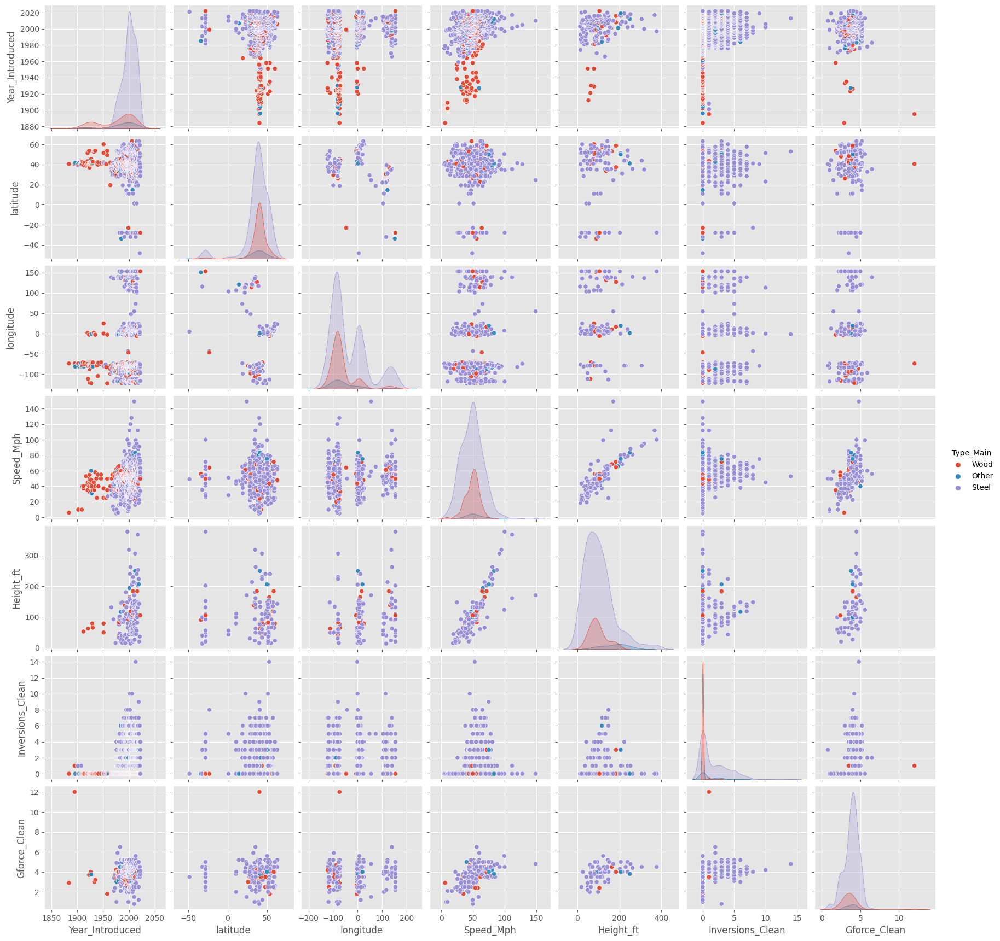

In [47]:
# Create a pair plot with hue based on 'Type_Main'
sns.pairplot(df,hue='Type_Main')

**Outlier Detection**

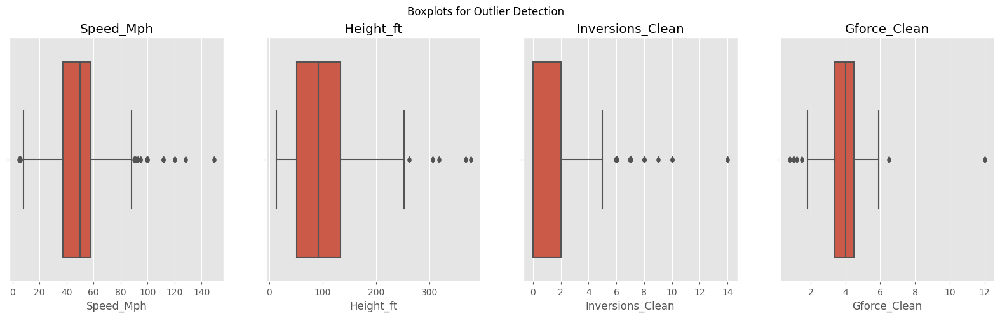

In [48]:
# boxplot to visualize distribution of all the numeric value we have
selected_columns = ['Speed_Mph','Height_ft', 'Inversions_Clean',
                    'Gforce_Clean']

# Create subplots for box plots
fig, axes = plt.subplots(1, len(selected_columns), figsize=(20, 5))
fig.suptitle('Boxplots for Outlier Detection')

# Create box plots for each selected column
for i, col in enumerate(selected_columns):
    sns.boxplot(ax=axes[i], x=df[col])
    axes[i].set_title(col)

plt.show()

Text(0, 0.5, 'Count')

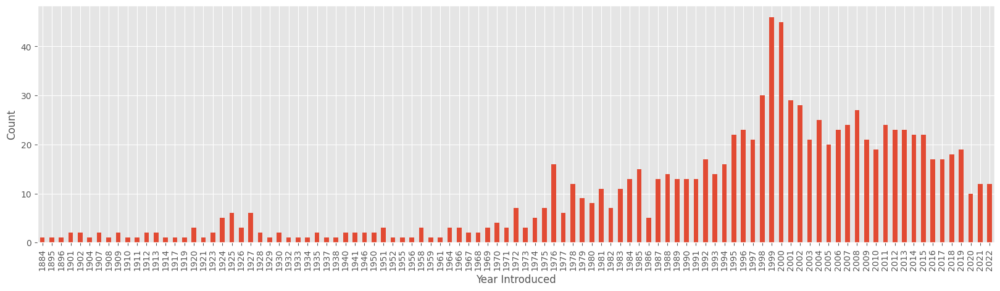

In [49]:
# Set the figure size
plt.figure(figsize=(20, 5))

# Sort by the index (Year_Introduced) before plotting
ax = df['Year_Introduced'].value_counts()\
    .sort_index()\
    .plot(kind='bar')
ax.set_xlabel('Year Introduced')
ax.set_ylabel('Count')

Text(0, 0.5, 'Count')

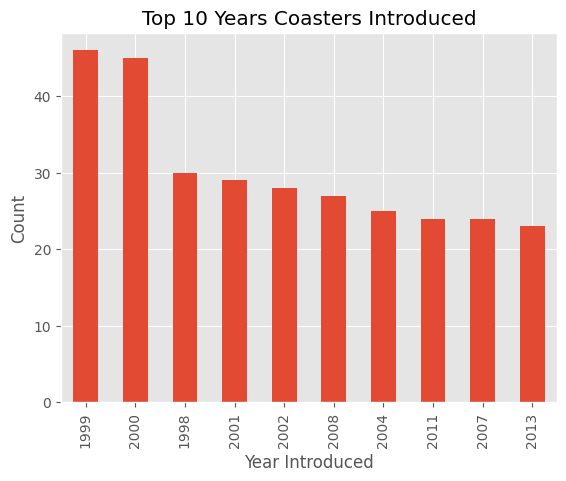

In [50]:
ax = df['Year_Introduced'].value_counts() \
    .head(10) \
    .plot(kind='bar', title='Top 10 Years Coasters Introduced')  # Create a bar plot for the top 10 years of coaster introduction
ax.set_xlabel('Year Introduced')  # Set the x-axis label
ax.set_ylabel('Count')  # Set the y-axis label

Text(0.5, 0, 'Speed (Mph)')

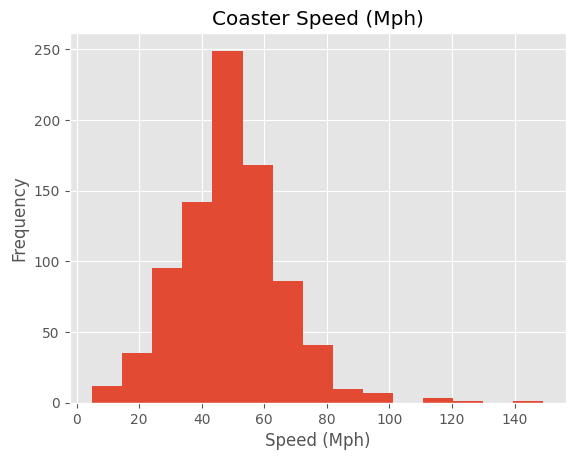

In [51]:
ax = df['Speed_Mph'].plot(kind='hist', 
                          bins=15, 
                          title='Coaster Speed (Mph)')  # Create a histogram plot
ax.set_xlabel('Speed (Mph)')  # Set the x-axis label

Text(0.5, 0, 'Speed (Mph)')

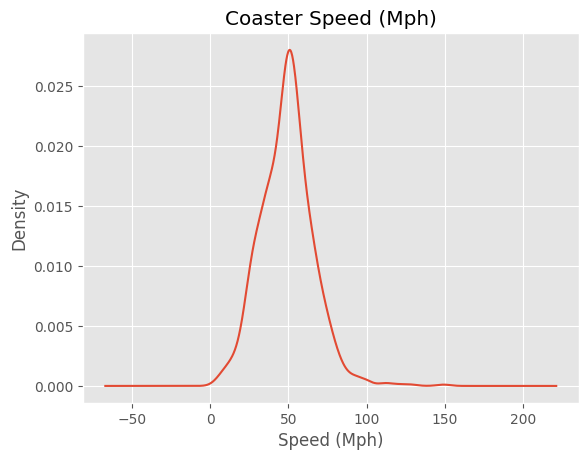

In [52]:
ax = df['Speed_Mph'].plot(kind='kde',
                          title='Coaster Speed (Mph)') # Create a KDE plot
ax.set_xlabel('Speed (Mph)') # Set the x-axis label

- The peak of the KDE curve occurs around 50 Mph.
- This indicates that coaster speeds around 50 Mph are common within the sampled data.

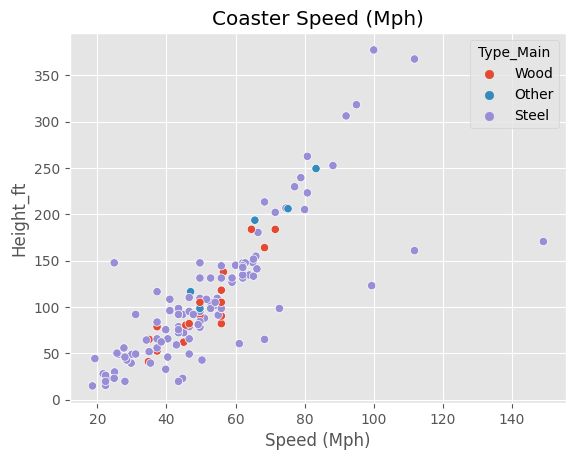

In [53]:
ax = sns.scatterplot(data=df, x='Speed_Mph', y='Height_ft', hue='Type_Main')  # Create a scatter plot
ax.set_title('Coaster Speed (Mph)')  # Set the title
ax.set_xlabel('Speed (Mph)')  # Set the x-axis label
plt.show() 

It appears that steel is the material that enables roller coasters to achieve greater heights and higher speeds.

**Note :**  Preliminary observations suggest a potential difference os speed and height between the material used in roller coaster construction. hypotheses testing will be use to determine if there is a correlation.

In [54]:
import plotly.express as px
fig = px.scatter_3d(df, x='Speed_Mph', y='Height_ft', z='Gforce_Clean',
              color='Type_Main')
fig.show()

**Outlier Detection across different type of materials**

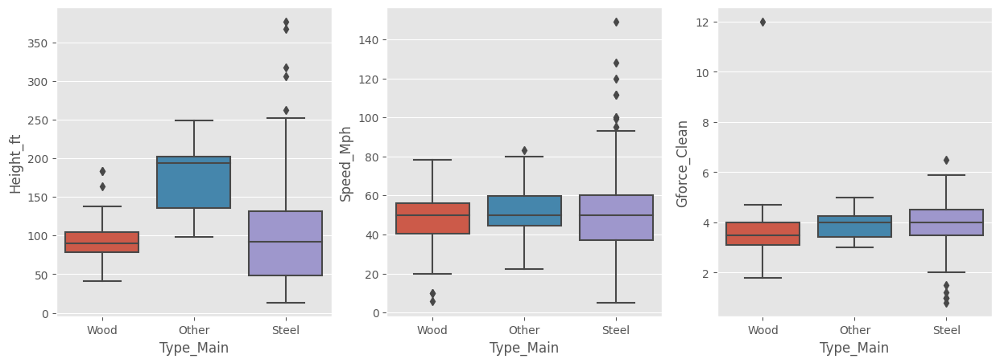

In [55]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Create the first boxplot on the first subplot
sns.boxplot(x = "Type_Main", y = "Height_ft", data = df, ax=axes[0])

# Create the second boxplot on the second subplot
sns.boxplot(x = "Type_Main", y = "Speed_Mph", data = df, ax=axes[1])

# Create the third boxplot on the third subplot
sns.boxplot(x = "Type_Main", y = "Gforce_Clean", data = df, ax=axes[2])

# Display the figure with the boxplots
plt.show()

Eliminating the outliers prior to formulating the hypotheses.

In [56]:
# List of columns you want to check for outliers
cols = ['Speed_Mph', 'Height_ft', 'Gforce_Clean']

# List of materials
materials = ['Steel', 'Wood', 'Other']

# Copy df to df2
df2 = df.dropna().copy()

for material in materials:
    for col in cols:
        # Subset the dataframe for the current material
        df_material = df2[df2['Type_Main'] == material]

        Q1 = df_material[col].quantile(0.25)
        Q3 = df_material[col].quantile(0.75)
        IQR = Q3 - Q1

        # Define bounds for non-outliers
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Remove outliers
        df2 = df2[~((df2['Type_Main'] == material) & ((df2[col] < lower_bound) | (df2[col] > upper_bound)))]

df2.head()


,Coaster_Name,Location,Status,Manufacturer,Year_Introduced,latitude,longitude,Type_Main,Opening_Date,Speed_Mph,Height_ft,Inversions_Clean,Gforce_Clean
179,Python (Efteling),Efteling,Operating,Vekoma,1981,51.6469,5.0536,Steel,1981-04-12,46.6,95.1,4,3.5
221,Mindbender (Galaxyland),Galaxyland,closed for maintenance as of july 30 no reopen...,Anton Schwarzkopf,1985,53.5236,-113.6203,Steel,1985-12-20,60.0,145.0,3,5.2
240,Lisebergbanan,Liseberg,Operating,Zierer,1987,57.6950,11.9925,Steel,1987-04-18,49.7,147.6,0,3.0
265,Goudurix,Parc Astérix,Operating,Vekoma,1989,49.1314,2.5714,Steel,1989-01-01,55.9,118.1,7,3.9
332,Condor (roller coaster),Walibi Holland,Operating,Vekoma,1994,52.4404,5.7615,Steel,1994-05-01,49.7,101.7,5,4.5


In [57]:
#check the class balance
df2['Type_Main'].value_counts(normalize=True)

Steel    0.927273
Wood     0.036364
Other    0.036364
Name: Type_Main, dtype: float64

given the imbalance in the dataset, we might want to consider using non-parametric tests, which do not require the assumption of normality,

**Define your hypotheses:**
- Null hypothesis (H0): There is no difference in material used and the maximum speed or height of the roller coasters.
- Alternative hypothesis (H1): There is difference in material used and the maximum speed or height of the roller coasters.

**significance level:**
- Set at 0.05, meaning that we accept a 5% chance of rejecting the null hypothesis when it is true.

In [58]:
# Step 1: Import necessary libraries
from scipy.stats import mannwhitneyu

# Step 2: Filter the DataFrame for the two materials of interest
df_wood = df2[df2['Type_Main'] == 'Wood']
df_steel = df2[df2['Type_Main'] == 'Steel']

# Step 3: Perform a Mann-Whitney U Test on the maximum speed
u_stat_speed, p_val_speed = mannwhitneyu(df_wood['Speed_Mph'], df_steel['Speed_Mph'])

# Step 4: Perform a Mann-Whitney U Test on the height
u_stat_height, p_val_height = mannwhitneyu(df_wood['Height_ft'], df_steel['Height_ft'])

# Step 5: Print the results
print(f'Mann-Whitney U Test results for maximum speed: U-Statistic = {u_stat_speed}, P-Value = {p_val_speed}')
print(f'Mann-Whitney U Test results for height: U-Statistic = {u_stat_height}, P-Value = {p_val_height}')


Mann-Whitney U Test results for maximum speed: U-Statistic = 93.5, P-Value = 0.04963170492919594
Mann-Whitney U Test results for height: U-Statistic = 91.0, P-Value = 0.06513444330467802


For maximum speed, 
- U-Statistic is 93.5 and the P-Value is 0.04963170492919594. Since the P-Value is less than 0.05, we reject the null hypothesis at the 5% significance level. This suggests that **there is a statistically significant difference in the maximum speed between the ‘Wood’ and ‘Steel’ categories**.

- **Note:** it’s important to note that the P-Value is right on the edge of the commonly used significance level (0.05)This means that the result is borderline, and we might want to interpret it with caution. It could be beneficial to have more data, if possible.

For height,
- the U-Statistic is 91.0 and the P-Value is 0.06513444330467802. Since the P-Value is greater than 0.05, we fail to reject the null hypothesis at the 5% significance level. This suggests that **there is not a statistically significant difference in the height between the ‘Wood’ and ‘Steel’ categories.**

# Step 4: Ask a Question about the data

Try to answer a question you have about the data using a plot or statistic.

- What are the locations with the fastest roller coasters (minimum of 10)?
- What are the most used material?
- What is the oldest roller coaster that is currently in operation, and specify the number of years it has been operational?


What are the locations with the fastest roller coasters (minimum of 10)?

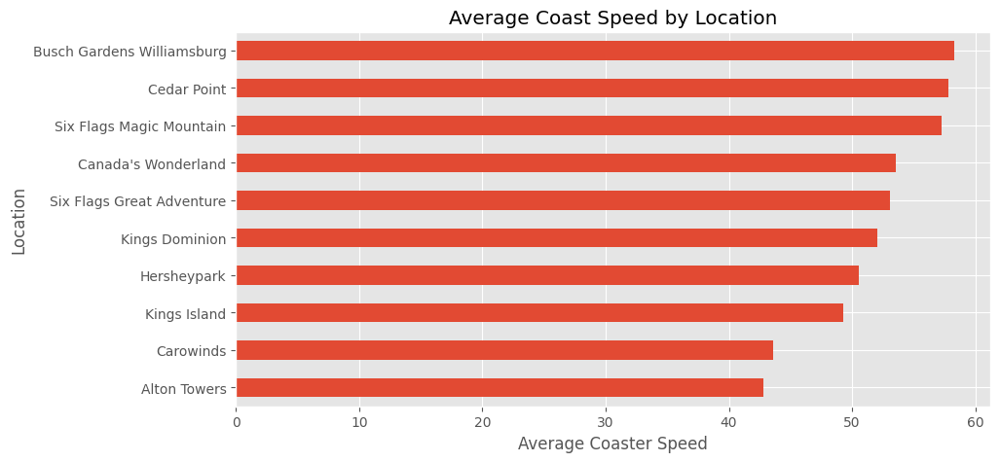

In [59]:
ax = df .query('Location != "Other"') \
        .groupby('Location')['Speed_Mph'] \
        .agg(['mean','count']) \
        .query('count >= 10') \
        .sort_values('mean')['mean'] \
        .plot(kind='barh', figsize=(10, 5), title='Average Coast Speed by Location')
ax.set_xlabel('Average Coaster Speed')
plt.show()

What are the most used material?

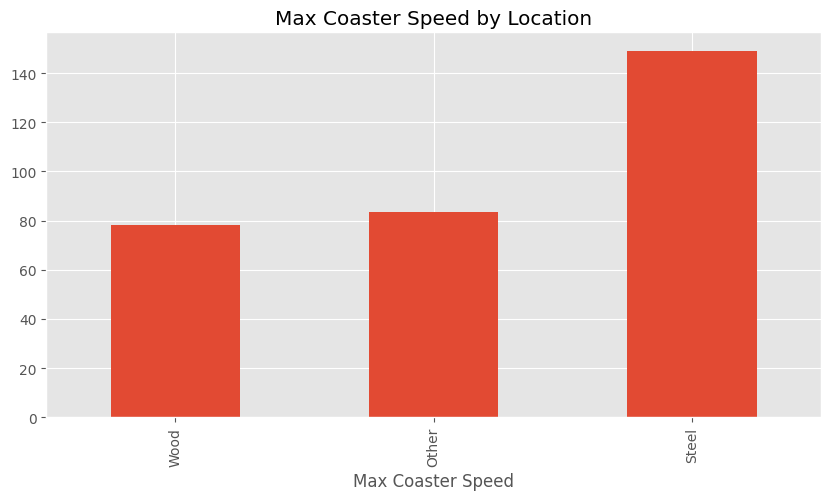

In [60]:
ax = df.groupby('Type_Main')['Speed_Mph'] \
        .agg(['max','count']) \
        .sort_values('max')['max'] \
        .plot(kind='bar', figsize=(10, 5), title='Max Coaster Speed by Location')
ax.set_xlabel('Max Coaster Speed')
plt.show()


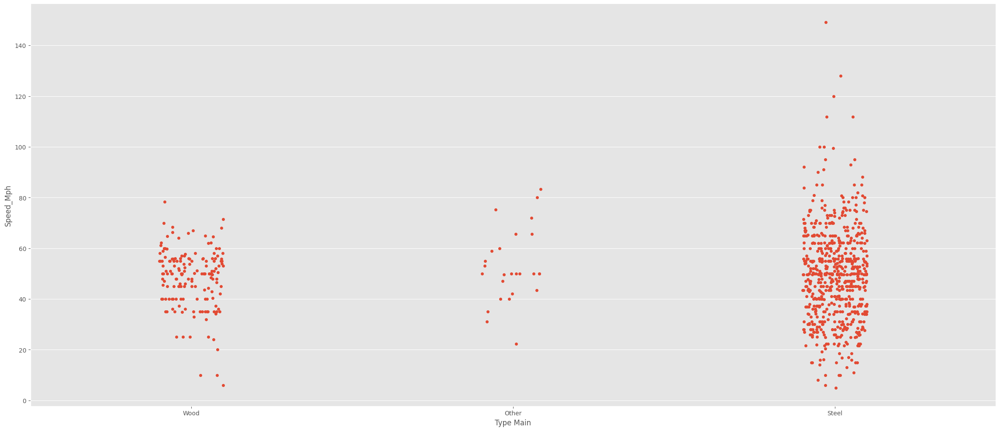

In [61]:
# Create a categorical plot with the custom color palette
sns.catplot(df, x="Type_Main", y="Speed_Mph", height=10, aspect=2.3)

# Add a label to the x-axis
plt.xlabel('Type Main')

# Display the plot
plt.show()

In [62]:
fig = px.scatter(df, x="Height_ft", y="Speed_Mph", color="Type_Main", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig.show()

What is the oldest roller coaster that is currently in operation, and specify the number of years it has been operational?

In [63]:
from datetime import date
# Add a new column with today's date
df["Today_Date"] = pd.to_datetime(date.today())

# Calculate the duration and convert it to years in one step
df["Years"] = (df["Today_Date"] - pd.to_datetime(df["Opening_Date"])).dt.days // 365

df.head(2)

,Coaster_Name,Location,Status,Manufacturer,Year_Introduced,latitude,longitude,Type_Main,Opening_Date,Speed_Mph,Height_ft,Inversions_Clean,Gforce_Clean,Today_Date,Years
0,Switchback Railway,Coney Island,Removed,LaMarcus Adna Thompson,1884,40.574,-73.978,Wood,1884-06-16,6.0,NaN,0,2.9,2024-05-03,139.0
1,Flip Flap Railway,Sea Lion Park,Removed,Lina Beecher,1895,40.578,-73.979,Wood,1895-01-01,NaN,NaN,1,12.0,2024-05-03,129.0


In [64]:
#pivot table of the oldest roller coaster
df[df['Status'] == 'Operating'].pivot_table(values='Years', index='Coaster_Name', aggfunc='max').nlargest(10, 'Years')

,Years
Coaster_Name,
Leap-The-Dips,122.0
The Great Scenic Railway,111.0
Jack Rabbit (Kennywood),104.0
Jack Rabbit (Seabreeze),104.0
Scenic Railway (roller coaster),103.0
Roller Coaster (Lagoon),102.0
Big Dipper (Blackpool Pleasure Beach),100.0
Giant Dipper,100.0
Thunderhawk (Dorney Park),100.0


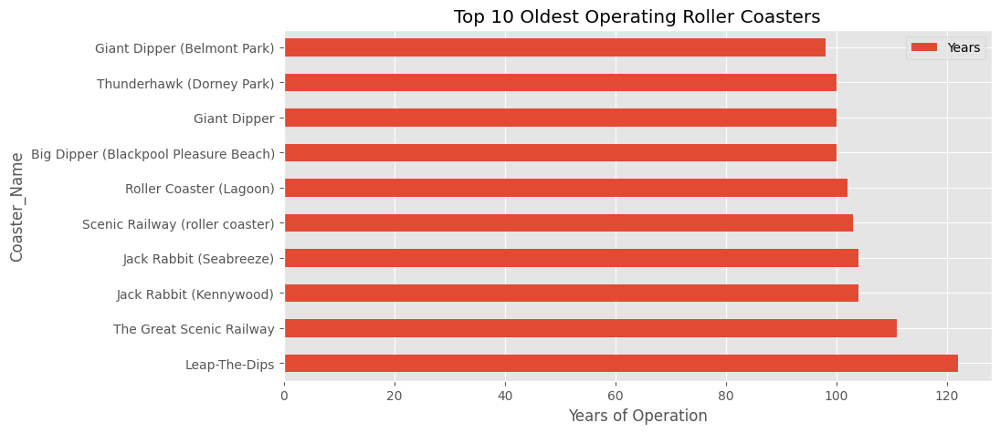

In [65]:
# Filter the DataFrame for rows where 'Status' is 'Operating', create a pivot table,
# select the top 10 rows based on 'Years', and plot a horizontal bar chart
ax = df[df['Status'] == 'Operating'].pivot_table(values='Years', index='Coaster_Name', aggfunc='max').nlargest(10, 'Years')\
    .plot(kind='barh', figsize=(10, 5), title='Top 10 Oldest Operating Roller Coasters')

# Set the x-axis label
ax.set_xlabel('Years of Operation')

# Display the plot
plt.show()